# **0. Project Introduction**

The emergent *Sharing Economy* led by companies like Airbnb represents a new economic force with the potential to further disrupt and catalyze the existing male-female ownership equilibrium in many places around the world.

1.   9x increase in female-owned US small businesses over the past 4 decades
*   4.6% to ~36% between 1972 and 2014
2.   34% of global small businesses are female-owned


*   Middle East: 23%
*   Sub-Saharan Africa: 29%
*   East Asia: 47%
*   Latin America / Caribbean: 50%

3.   ***56% of global Airbnb hosts are women***


Despite the fact that more than half of all Airbnb hosts are women, we wanted to investigate:


1.   Are women more likely than men to be Airbnb hosts in NYC, given current Airbnb reports?
2.   How does female ownership data from **NYC** compare with similar data from other key geographies including **Europe (London)**, **Sub-Saharan Africa (Cape Town)**, and **East Asia (Hong Kong)**?
3. How does the data between female and male hosts in NYC compare with regards to **average units under management**, **nights available to rent**, and **average per night charge**?
4. Do female hosts in NYC receive better **post-stay satisfaction ratings** than their male counterparts?
5. Are these patterns generalizable to the geographies outlined above?




# **I. Tools used for Analysis**

The below code block contains key libraries used for our analysis, including:
1. **Pandas** for storing data currently being analyzed
2. **Matplotlib** to plot visualizations of the data
3. **Seaborn** of Mapping?
4.  **Numpy** for arrays

In [1]:
# The below code block contains key libraries used for our analysis, including:
# 1. Pandas for storing data currently being analyzed
# 2. Matplotlib amd Seaborn to plot visualizations of the data
# 3. Numpy for arrays

import pandas as pd
pd.set_option('display.max_rows', None)
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np

In [3]:
# Additional libraries for guessing Airbnb host gender included:
# 1. genderize
# 2. gender_guesser 
# Apart from the above libraries we have made our own model for gender gussing

!pip install genderize
!pip install gender_guesser
!pip install xpinyin

# **II. Loading the Data**

We loaded the data.

In [4]:
# Here and below, the drive is mounted

from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
!ls drive/

MyDrive  Shareddrives


In [6]:
# Below assigns variable names to the data sets from New York City, Hong Kong
# Cape Town, and London.

# The code blocks below return the first five rows of each csv file to check
# that the data is populated correctly within Google Colab

prefix = '/content/drive/MyDrive/'
ny_df = pd.read_csv(prefix+'new_york_01_19.csv')
hk_df = pd.read_csv(prefix+'hong_kong_01_19.csv')
ct_df = pd.read_csv(prefix+'cape_town_01_19.csv')
l_df = pd.read_csv(prefix+'london_01_19.csv')

In [7]:
ny_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2515,Stay at Chez Chic budget room #1,2758,Steph,Manhattan,Harlem,40.799205,-73.953676,Private room,59,2,175,2018-12-29,1.40,3,310
1,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.647486,-73.972370,Private room,149,1,9,2018-10-19,0.24,8,365
2,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.753621,-73.983774,Entire home/apt,225,1,43,2019-01-02,0.39,2,365
3,3330,++ Brooklyn Penthouse Guestroom ++,4177,Jbee,Brooklyn,Williamsburg,40.708558,-73.942362,Private room,70,5,39,2018-12-07,0.36,3,282
4,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.809018,-73.941902,Private room,150,3,0,NaN,NaN,1,365


In [8]:
hk_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,69074,Beautiful oasis of plants & art @ best location,160139,Amy,NaN,Central & Western,22.283516,114.150177,Entire home/apt,1412,3,120,2018-12-16,1.24,1,139
1,101765,Lamma Island flat 2min walk from the beach!,532909,Michael,NaN,Islands,22.200224,114.134609,Entire home/apt,431,2,8,2018-11-23,0.84,1,142
2,103760,Central Centre 5 min walk to/from Central MTR,304876,Brend,NaN,Central & Western,22.284074,114.155696,Entire home/apt,855,2,243,2018-12-24,2.63,12,347
3,132773,Fabulous 2 Bdrm Aprt Open kitchen,304876,Brend,NaN,Central & Western,22.288679,114.144944,Entire home/apt,1059,2,167,2019-01-09,1.83,12,321
4,133390,"Soho, Hong Kong 1 bedroom flat",654642,Robin,NaN,Central & Western,22.283435,114.155392,Entire home/apt,941,2,27,2015-06-30,0.29,1,74


In [9]:
ct_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3191,Malleson Garden Cottage,3754,Brigitte,NaN,Ward 57,-33.947387,18.475997,Entire home/apt,651,3,42,2018-12-21,0.61,1,336
1,13044,JAMBO Guest House / Green Room,50700,Barry & Mina,NaN,Ward 115,-33.907711,18.405347,Private room,1897,3,4,2016-02-17,0.05,5,336
2,15007,Blaauwberg House,59072,Dirk,NaN,Ward 23,-33.801138,18.461803,Entire home/apt,2050,2,25,2018-12-02,0.40,3,348
3,15068,Grande Bay,59318,Linda,NaN,Ward 23,-33.787985,18.460825,Entire home/apt,2797,4,0,NaN,NaN,11,334
4,15077,Top relaxed beach living in style,59342,Georg,NaN,Ward 4,-33.858776,18.489703,Entire home/apt,1343,6,5,2016-12-10,0.07,5,343


In [10]:
l_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,9554,"Cozy, 3 minutes to Piccadilly Line",31655,Guy,NaN,Haringey,51.587767,-0.105666,Private room,35,1,134,2019-01-01,1.64,4,0
1,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.572243,-0.209060,Private room,29,15,118,2018-11-01,1.11,4,0
2,28010,LOVELY Dbl Bedroom in Shoreditch!,119316,Valentina,NaN,Tower Hamlets,51.524969,-0.073727,Private room,50,3,38,2018-01-02,0.48,3,81
3,33332,Twickenham Stadium & Wimbledon easy reach Ensuite,144444,Chi-Chi,NaN,Hounslow,51.465074,-0.324207,Private room,100,1,4,2018-11-04,0.04,2,365
4,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.479345,-0.280662,Entire home/apt,195,3,63,2018-12-30,0.63,1,279


In [11]:
print(f'Shape of New York Dataframe {ny_df.shape}')
print(f'Shape of Hong Kong Dataframe {hk_df.shape}')
print(f'Shape of Cape Town Dataframe {ct_df.shape}')
print(f'Shape of London Dataframe {l_df.shape}')

Shape of New York Dataframe (50717, 16)
Shape of Hong Kong Dataframe (10477, 16)
Shape of Cape Town Dataframe (21954, 16)
Shape of London Dataframe (77459, 16)


# **III. Data Cleaning**

We cleaned each csv file by checking for duplicate entries and null values.

In [12]:
# Here we removed duplicates from the source csv files

print(f'Number of Duplicate rows in New York dataset = {ny_df.duplicated().sum()}')
ny_df.drop_duplicates(inplace=True)

print(f'Number of Duplicate rows in Hong Kong dataset = {hk_df.duplicated().sum()}')
hk_df.drop_duplicates(inplace=True)

print(f'Number of Duplicate rows in Cape Town dataset = {ct_df.duplicated().sum()}')
ct_df.drop_duplicates(inplace=True)

print(f'Number of Duplicate rows in London dataset = {l_df.duplicated().sum()}')
l_df.drop_duplicates(inplace=True)

Number of Duplicate rows in New York dataset = 0
Number of Duplicate rows in Hong Kong dataset = 0
Number of Duplicate rows in Cape Town dataset = 0
Number of Duplicate rows in London dataset = 0


In [13]:
# Here we check for any null values in the NY dataset

print('Nulls in New York Dataset')
ny_df.isna().sum()


Nulls in New York Dataset


id                                    0
name                                 16
host_id                               0
host_name                             7
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10375
reviews_per_month                 10375
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [14]:
# Here we check for any null values in the HK dataset

print('Nulls in Hong Kong Dataset')
hk_df.isna().sum()

Nulls in Hong Kong Dataset


id                                    0
name                                  8
host_id                               0
host_name                             0
neighbourhood_group               10477
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        2517
reviews_per_month                  2517
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [15]:
# Here we check for any null values in the Cape Town dataset

print('Nulls in Cape Town Dataset')
ct_df.isna().sum()

Nulls in Cape Town Dataset


id                                    0
name                                  0
host_id                               0
host_name                             4
neighbourhood_group               21954
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        7188
reviews_per_month                  7188
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [16]:
# Here we check for any null values in the London dataset

print('Nulls in London Dataset')
l_df.isna().sum()

Nulls in London Dataset


id                                    0
name                                 28
host_id                               0
host_name                             8
neighbourhood_group               77459
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       18682
reviews_per_month                 18682
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [17]:
ny_df.fillna({'last_review': 0}, inplace=True)
ny_df.fillna({'reviews_per_month': 0}, inplace=True)

hk_df.fillna({'last_review': 0}, inplace=True)
hk_df.fillna({'reviews_per_month': 0}, inplace=True)

ct_df.fillna({'last_review': 0}, inplace=True)
ct_df.fillna({'reviews_per_month': 0}, inplace=True)

l_df.fillna({'last_review': 0}, inplace=True)
l_df.fillna({'reviews_per_month': 0}, inplace=True)

In [18]:
ny_df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,5.071700e+04,5.071700e+04,50717.000000,50717.000000,50717.000000,50717.000000,50717.000000,50717.000000,50717.000000,50717.000000
mean,1.689978e+07,5.768757e+07,40.729576,-73.953623,150.712227,6.836899,22.160183,1.137423,4.936905,124.929866
std,9.476357e+06,6.642563e+07,0.053384,0.044365,220.761064,19.138824,41.099465,1.584918,16.900761,139.153920
min,2.515000e+03,2.571000e+03,40.499794,-74.240843,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,8.808863e+06,7.125313e+06,40.691167,-73.983731,69.000000,1.000000,1.000000,0.050000,1.000000,0.000000
50%,1.786061e+07,2.726399e+07,40.724115,-73.956726,109.000000,2.000000,5.000000,0.420000,1.000000,69.000000
75%,2.505412e+07,9.029444e+07,40.763258,-73.938222,175.000000,5.000000,24.000000,1.680000,2.000000,256.000000
max,3.141951e+07,2.353192e+08,40.911708,-73.712992,10000.000000,1250.000000,567.000000,19.980000,178.000000,365.000000


In [19]:
hk_df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,1.047700e+04,1.047700e+04,0.0,10477.000000,10477.000000,10477.000000,10477.000000,10477.000000,10477.000000,10477.000000,10477.000000
mean,1.953230e+07,7.329699e+07,NaN,22.306343,114.157153,913.916388,6.760428,21.413477,1.229227,11.831345,146.903789
std,8.638397e+06,6.744838e+07,NaN,0.052013,0.048941,2740.297539,30.427545,40.754355,1.679147,24.708072,140.681305
min,6.907400e+04,3.288700e+04,NaN,22.158560,113.856697,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,1.318306e+07,1.722549e+07,NaN,22.282132,114.150193,361.000000,1.000000,1.000000,0.030000,1.000000,3.000000
50%,2.114237e+07,4.729917e+07,NaN,22.296374,114.170126,573.000000,1.000000,5.000000,0.520000,3.000000,90.000000
75%,2.696659e+07,1.221314e+08,NaN,22.314525,114.175001,918.000000,3.000000,22.000000,1.800000,11.000000,312.000000
max,3.161495e+07,2.369162e+08,NaN,22.559769,114.361732,157007.000000,1124.000000,569.000000,14.240000,154.000000,365.000000


In [20]:
ct_df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,2.195400e+04,2.195400e+04,0.0,21954.000000,21954.000000,21954.000000,21954.000000,21954.000000,21954.000000,21954.000000,21954.000000
mean,1.811966e+07,7.500857e+07,NaN,-33.960045,18.473291,2232.947436,3.742598,10.582263,0.630270,8.082263,197.497814
std,8.512003e+06,6.399493e+07,NaN,0.099720,0.122476,4877.300632,10.345149,22.344489,0.989401,27.360549,138.517404
min,3.191000e+03,1.687000e+03,NaN,-34.262331,18.320154,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,1.114253e+07,2.390070e+07,NaN,-34.021554,18.403415,665.000000,1.000000,0.000000,0.000000,1.000000,58.000000
50%,1.830497e+07,5.230835e+07,NaN,-33.935140,18.434899,1094.000000,2.000000,2.000000,0.170000,1.000000,209.500000
75%,2.478717e+07,1.139709e+08,NaN,-33.910751,18.482322,2105.000000,4.000000,10.000000,0.940000,4.000000,334.000000
max,3.175032e+07,2.379877e+08,NaN,-33.514805,18.940702,179997.000000,365.000000,323.000000,9.870000,229.000000,365.000000


In [21]:
l_df.describe()

,id,host_id,neighbourhood_group,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,7.745900e+04,7.745900e+04,0.0,77459.000000,77459.000000,77459.000000,77459.000000,77459.000000,77459.000000,77459.000000,77459.000000
mean,1.860097e+07,6.757817e+07,NaN,51.509643,-0.127962,112.674809,4.012561,15.657974,0.922980,23.269562,121.333209
std,8.803752e+06,6.745990e+07,NaN,0.045955,0.091646,211.227804,15.290696,32.760790,1.322309,125.582104,135.846741
min,9.554000e+03,5.160000e+02,NaN,51.294794,-0.501305,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,1.206612e+07,1.285750e+07,NaN,51.485356,-0.187942,45.000000,1.000000,1.000000,0.030000,1.000000,0.000000
50%,1.996718e+07,3.898652e+07,NaN,51.513865,-0.124877,80.000000,2.000000,4.000000,0.410000,1.000000,69.000000
75%,2.614592e+07,1.141853e+08,NaN,51.537539,-0.070147,130.000000,3.000000,16.000000,1.240000,4.000000,238.000000
max,3.152918e+07,2.362630e+08,NaN,51.685230,0.317523,19000.000000,1125.000000,595.000000,16.010000,1064.000000,365.000000


In [22]:
hk_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,69074,Beautiful oasis of plants & art @ best location,160139,Amy,NaN,Central & Western,22.283516,114.150177,Entire home/apt,1412,3,120,2018-12-16,1.24,1,139
1,101765,Lamma Island flat 2min walk from the beach!,532909,Michael,NaN,Islands,22.200224,114.134609,Entire home/apt,431,2,8,2018-11-23,0.84,1,142
2,103760,Central Centre 5 min walk to/from Central MTR,304876,Brend,NaN,Central & Western,22.284074,114.155696,Entire home/apt,855,2,243,2018-12-24,2.63,12,347
3,132773,Fabulous 2 Bdrm Aprt Open kitchen,304876,Brend,NaN,Central & Western,22.288679,114.144944,Entire home/apt,1059,2,167,2019-01-09,1.83,12,321
4,133390,"Soho, Hong Kong 1 bedroom flat",654642,Robin,NaN,Central & Western,22.283435,114.155392,Entire home/apt,941,2,27,2015-06-30,0.29,1,74


In [23]:
print('\nNew York dataset Before Dropping')
print(ny_df.isna().sum())
ny_df.dropna(axis=0, how='any',inplace=True)
print('New York dataset  After Dropping')
print(ny_df.isna().sum())

# print('\nHong Kong dataset Before Dropping')
# print(hk_df.isna().sum())
# hk_df.dropna(axis=0, how='any',inplace=True)
# print('Hong Kong dataset  After Dropping')
# print(hk_df.isna().sum())

# print('\nCape Town dataset Before Dropping')
# print(ct_df.isna().sum())
# ct_df.dropna(axis=0, how='any',inplace=True)
# print('\nCape Town dataset  After Dropping')
# print(ct_df.isna().sum())

# print('\nLondon dataset Before Dropping')
# print(l_df.isna().sum())
# l_df.dropna(axis=0, how='any',inplace=True)
# print('\nLondon dataset  After Dropping')
# print(l_df.isna().sum())



New York dataset Before Dropping
id                                 0
name                              16
host_id                            0
host_name                          7
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
dtype: int64
New York dataset  After Dropping
id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
pric

In [24]:
# Drop columns not required for our analysis
ny_df.drop(['id', 'name', 'neighbourhood_group'], axis=1, inplace=True)
hk_df.drop(['id', 'name', 'neighbourhood_group'], axis=1, inplace=True)
ct_df.drop(['id', 'name', 'neighbourhood_group'], axis=1, inplace=True)
l_df.drop(['id', 'name', 'neighbourhood_group'], axis=1, inplace=True)

In [25]:
# Confirm if columns were dropped
print(ny_df.columns)
print(hk_df.columns)
print(ct_df.columns)
print(l_df.columns)

Index(['host_id', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')
Index(['host_id', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')
Index(['host_id', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')
Index(['host_id', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_

# **IV. Building our own model for gender classification**

In [26]:
ny_df.columns

Index(['host_id', 'host_name', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [27]:
import nltk
import random
nltk.download('names')

[nltk_data] Downloading package names to /root/nltk_data...
[nltk_data]   Unzipping corpora/names.zip.


True

In [28]:
def get_gender_features(word):
     return {
        'last_letter': word[-1],
        'first_letter': word[0],
        'penultimate_letter': word[-2],
        'last_two_letters': word[-2:]
    }

get_gender_features('Sumanth')

{'first_letter': 'S',
 'last_letter': 'h',
 'last_two_letters': 'th',
 'penultimate_letter': 't'}

In [29]:
names = nltk.corpus.names
names.fileids()

['female.txt', 'male.txt']

In [30]:
male_names = names.words('male.txt')
female_names = names.words('female.txt')

labeled_names = []
labeled_names += [("female", name) for name in female_names] 
labeled_names += [("male", name) for name in male_names]

labeled_featuresets = [(get_gender_features(name), gender) for (gender, name) in labeled_names]
random.shuffle(labeled_featuresets)

In [31]:
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(labeled_featuresets, test_size=0.8)
classifier = nltk.NaiveBayesClassifier.train(train_set)


In [32]:
def get_gender(name):
  if not isinstance(name, str):
    return 2
  name = name.lower().split(" ")[0]
  if len(name) < 2:
    return 2
  if classifier.classify(get_gender_features(name)) == 'male':
    return 0
  else:
    return 1


In [33]:
test_names= ["Adam", "Ishan", "Malena", "Justin"]

for t_n in test_names:
  print(t_n, get_gender(t_n))

Adam 0
Ishan 0
Malena 1
Justin 0


In [34]:
ny_df['gender'] = ny_df.apply(lambda row: get_gender(row['host_name']), axis=1)
ct_df['gender'] = ct_df.apply(lambda row: get_gender(row['host_name']), axis=1)
l_df['gender'] = l_df.apply(lambda row: get_gender(row['host_name']), axis=1)

## Gender Classifier for Chinese names for Hong Kong Dataset 

In [35]:
# Reference: Idea from https://stackoverflow.com/questions/2718196/find-all-chinese-text-in-a-string-using-python-and-regex
def is_string_chinese(value):
  RE = re.compile(u'[⺀-⺙⺛-⻳⼀-⿕々〇〡-〩〸-〺〻㐀-䶵一-鿃豈-鶴侮-頻並-龎]', re.UNICODE)
  if RE.match(value):
    return True
  return False

In [36]:
# Dataset & Idea from the research paper: https://www.researchgate.net/publication/269630594_9800_Chinese_Names_with_Gender

import re
from xpinyin import Pinyin

chinese_names_df = pd.read_csv(prefix+ 'ChineseNames.csv')

def remove_last_name(name):
  return name[1:]

def convert_name_to_pinyin(name):
  return Pinyin().get_pinyin(name)

def process_chinese_name(name):
  if not name and not is_string_chinese(name):
    return name
  name = remove_last_name(name)
  name = convert_name_to_pinyin(name)
  return name

In [37]:
# This will take about 2 minutes to run
# Here we are converting chinese names from the chinese names dataset to pinyin
chinese_names_df['Name'] = chinese_names_df['Name'].apply(process_chinese_name)

In [39]:
def get_gender_features_chinese(word):
     return {
        'first_two_letters': word[:2],
        'first_three_letters': word[:3],
        'first_four_letters': word[:4],
        'last_four_letters': word[-4:],
        'last_three_letters': word[-3:],
        'last_two_letters': word[-2:]
    }

In [40]:
chinese_male_names = chinese_names_df[chinese_names_df['Gender'] == 'M']['Name']
chinese_female_names = chinese_names_df[chinese_names_df['Gender'] == 'F']['Name']

chinese_labeled_names = []
chinese_labeled_names += [("female", name) for name in chinese_female_names] 
chinese_labeled_names += [("male", name) for name in chinese_male_names]

chinese_labeled_featuresets = [(get_gender_features_chinese(name), gender) for (gender, name) in chinese_labeled_names]
random.shuffle(chinese_labeled_featuresets)

In [41]:
chinese_train_set, chinese_test_set = train_test_split(chinese_labeled_featuresets, test_size=0.8)
chinese_classifier = nltk.NaiveBayesClassifier.train(chinese_train_set)

In [42]:
def get_gender_chinese(name):

  if len(name) < 2:
    return 2
  if not is_string_chinese(name):
    return get_gender(name)
  if chinese_classifier.classify(get_gender_features_chinese(process_chinese_name(name))) == 'male':
    return 0
  else:
    return 1

In [43]:

people = ['long', 
          'xiao-long',
          'bing-bing', 
          'zi-dan', 
          'lian-jie', 
          'yu-ling',
          'en-mei',
          'ming-na', 
          'ze-dong', 
         'jin-ping']
for name in people:
  get_gender_chinese(name)

In [44]:
hk_df['gender'] = hk_df.apply(lambda row: get_gender_chinese(row['host_name'].split(" ")[0]), axis=1)

# **V. Analysis**

### A. Room types distribution 

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


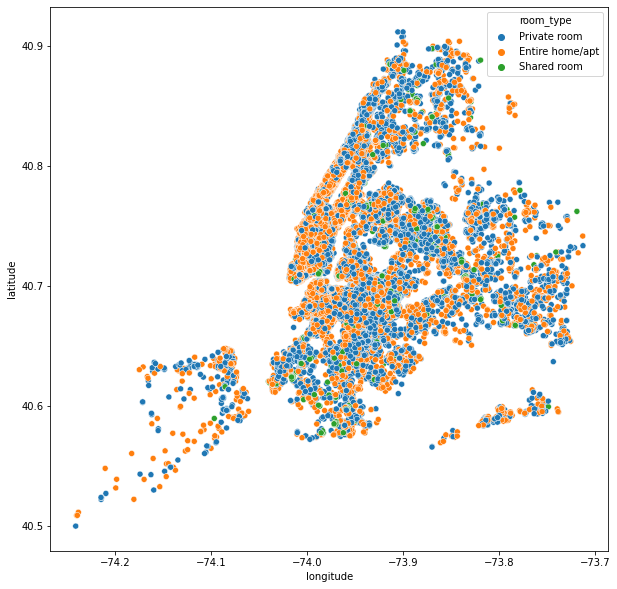

In [45]:
# We first have a scatterplot of room types
plt.figure(figsize=(10,10))
sns.scatterplot(ny_df.longitude,ny_df.latitude,hue=ny_df.room_type)
plt.ioff()

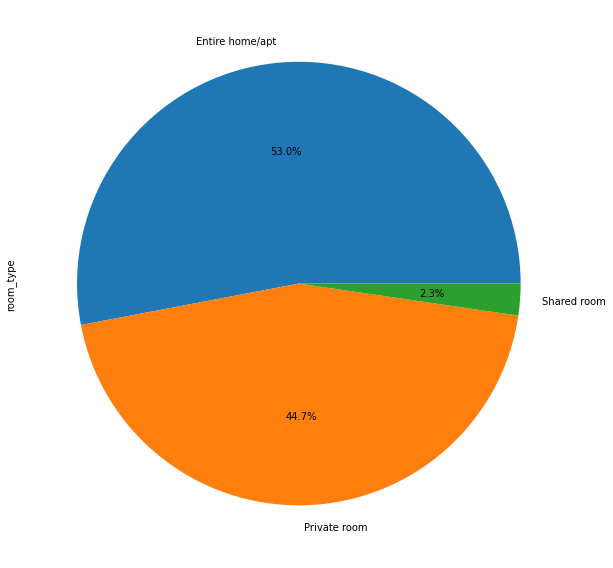

In [46]:
#Using PieChart
ny_df.room_type.value_counts().plot.pie(autopct='%1.1f%%',figsize=(10.2, 10.2))

### B. Adding gender column based on names 

We tried using several Python packages such as gender-guesser, but they were pretty slow(since they build a Python dictionary by loading names and gender from a file and then search for names in the dictionary to find the gender, which in our opinion is an age old technique). They used to take approximately 20 minutes to guess gender for a dataset with 50,000 rows(see code below). We were able to built a model which can guess the gender more accurately within 5 seconds for 50,000 rows.

In [47]:
# https://pypi.org/project/gender-guesser/
# We assign 0 to male and 1 to female

# Adding another library for gender to see if it makes a difference  - Ishan
# from genderize import Genderize

# import gender_guesser.detector as gender

# def getGender(name):
#   detector = gender.Detector()
#   gen = detector.get_gender(name)
#   if gen == 'male':
#     return 0
#   else:
#     return 1

In [48]:
# Get the first 5 rows for each city with gender classified
print(ny_df.head())
print(hk_df.head())
print(ct_df.head())
print(l_df.head())

   host_id  host_name  ... availability_365  gender
0     2758      Steph  ...              310       1
1     2787       John  ...              365       0
2     2845   Jennifer  ...              365       0
3     4177       Jbee  ...              282       1
4     4632  Elisabeth  ...              365       1

[5 rows x 14 columns]
   host_id host_name  ... availability_365  gender
0   160139       Amy  ...              139       0
1   532909   Michael  ...              142       0
2   304876     Brend  ...              347       0
3   304876     Brend  ...              321       0
4   654642     Robin  ...               74       0

[5 rows x 14 columns]
   host_id     host_name  ... availability_365  gender
0     3754      Brigitte  ...              336       1
1    50700  Barry & Mina  ...              336       0
2    59072          Dirk  ...              348       0
3    59318         Linda  ...              334       1
4    59342         Georg  ...              343       0

[5 ro

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'New York - Gender Distribution of hosts')

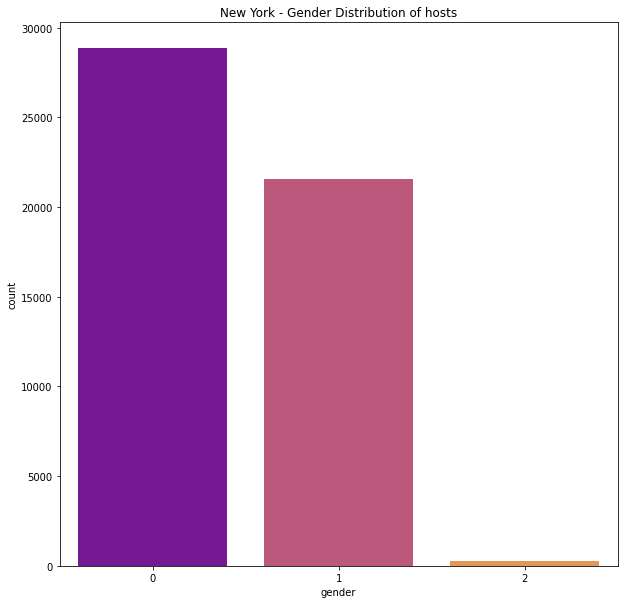

In [56]:
# Gender distribution of Airbnb hosts in NYC
sns.countplot(ny_df['gender'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('New York - Gender Distribution of hosts')

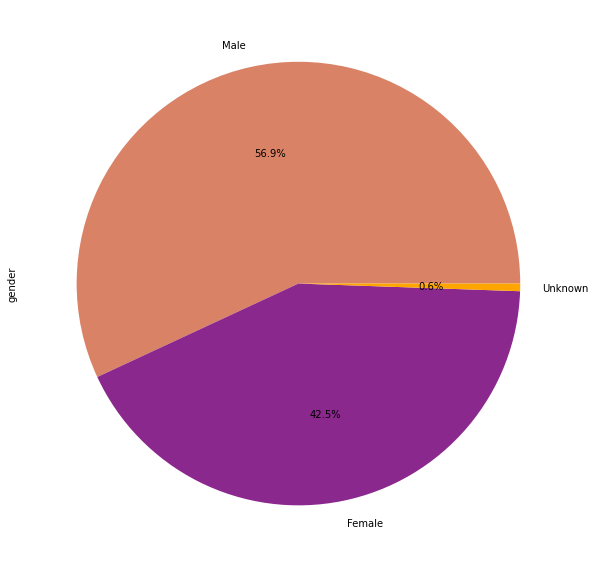

In [59]:
ny_df['gender'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10.2, 10.2), labels= ['Male', 'Female', 'Unknown'], colors = ['#da8266', '#8b288d', '#ffa500'])

Looking at the above graph, we're now able to answer our first question: **in NYC, women are more likely than men to be airbnb hosts**.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Hong Kong - Gender Distribution of hosts')

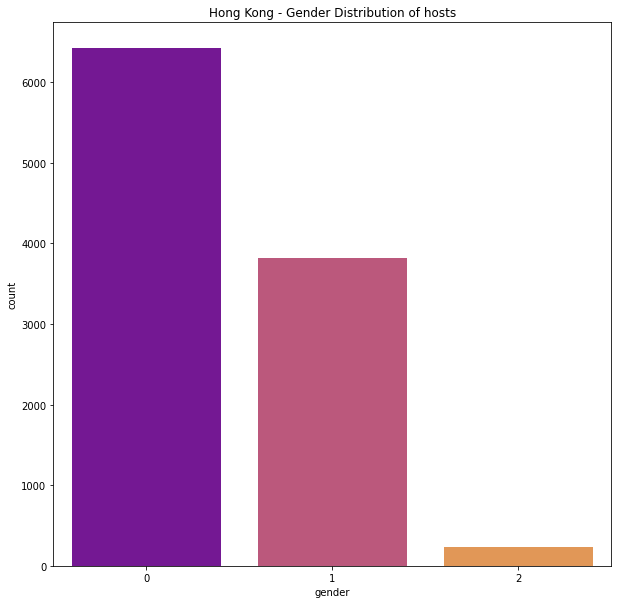

In [60]:
# Gender distribution of Airbnb hosts in HK
sns.countplot(hk_df['gender'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Hong Kong - Gender Distribution of hosts')

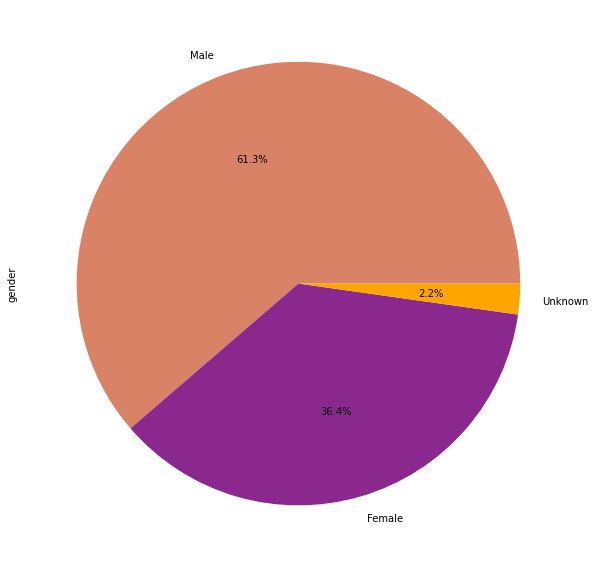

In [66]:
hk_df['gender'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10.2, 10.2), labels= ['Male', 'Female', 'Unknown'], colors = ['#da8266', '#8b288d', '#ffa500'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'Capetown - Gender Distribution of hosts')

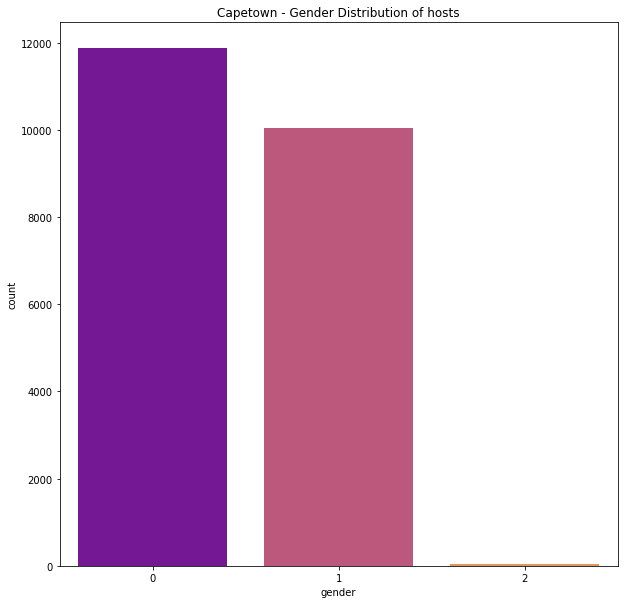

In [64]:
# Gender distribution of Airbnb hosts in Cape Town
sns.countplot(ct_df['gender'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Capetown - Gender Distribution of hosts')

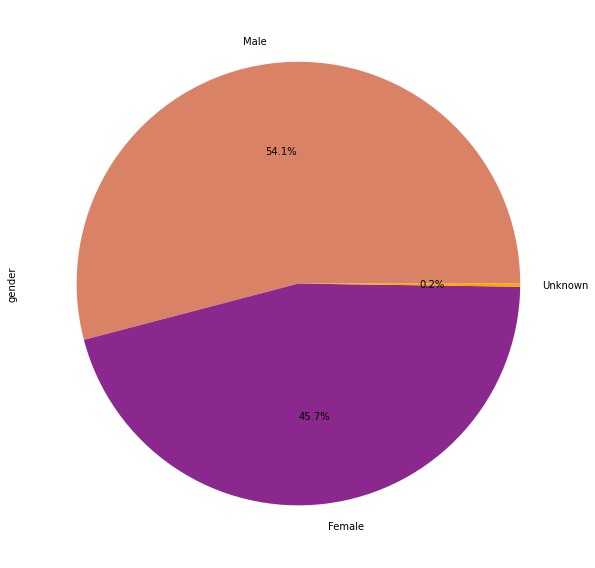

In [67]:
ct_df['gender'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10.2, 10.2), labels= ['Male', 'Female', 'Unknown'], colors = ['#da8266', '#8b288d', '#ffa500'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0.5, 1.0, 'London - Gender Distribution of hosts')

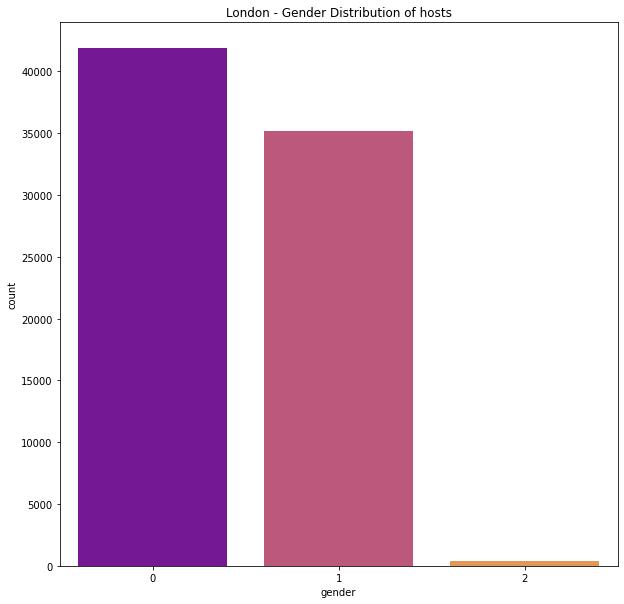

In [68]:
# Gender distribution of Airbnb hosts in London
sns.countplot(l_df['gender'], palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('London - Gender Distribution of hosts')

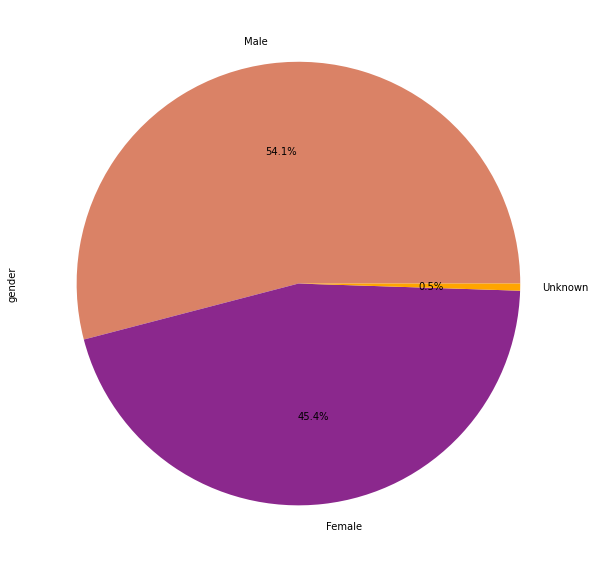

In [70]:
l_df['gender'].value_counts().plot.pie(autopct='%1.1f%%',figsize=(10.2, 10.2), labels= ['Male', 'Female', 'Unknown'], colors = ['#da8266', '#8b288d', '#ffa500'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


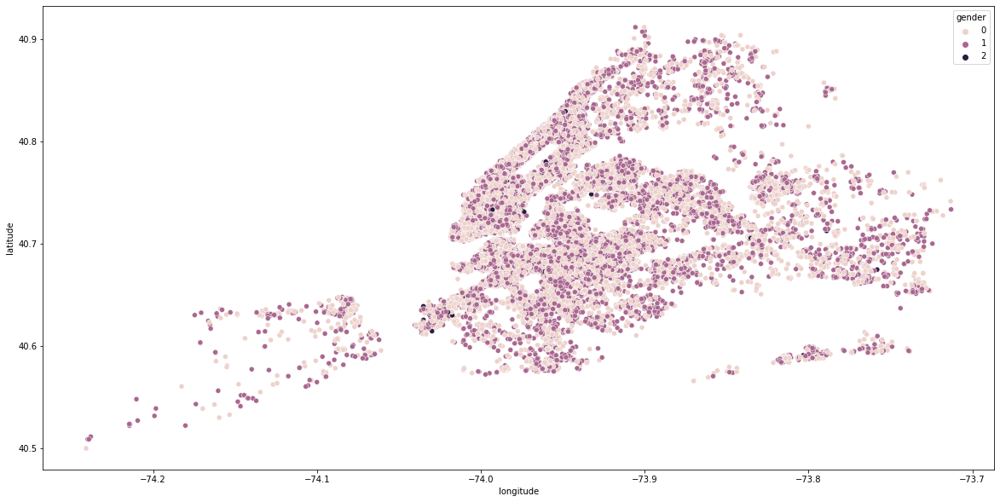

In [71]:
plt.figure(figsize=(20,10))
sns.scatterplot(ny_df.longitude,ny_df.latitude,hue=ny_df.gender)
plt.ioff()

In [72]:
import plotly
import plotly.offline as offline
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot
offline.init_notebook_mode()


In [73]:
print("New York Mean Latitude and Longitude ",ny_df.latitude.mean(), ny_df.longitude.mean())
print("Hong Kong Mean Latitude and Longitude ",hk_df.latitude.mean(), hk_df.longitude.mean())
print("Cape Town Mean Latitude and Longitude ",ct_df.latitude.mean(), ct_df.longitude.mean())
print("London Mean Latitude and Longitude ",l_df.latitude.mean(), l_df.longitude.mean())


New York Mean Latitude and Longitude  40.729568738310775 -73.95362362129565
Hong Kong Mean Latitude and Longitude  22.306343432170827 114.15715288772994
Cape Town Mean Latitude and Longitude  -33.960044910652066 18.473291373691648
London Mean Latitude and Longitude  51.50964261621862 -0.12796191902405976


In [74]:
data = [go.Scattermapbox(
            lat= ny_df.latitude,
            lon= ny_df.longitude,
            mode='markers',
            marker=dict(
                size= 5,
                color = 'violet',
                opacity = .8),
            name ='ny_map'
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic3VtYW50aHJlZGR5bSIsImEiOiJja28zMXNxOWIwbWUyMnZscjgydTVsNmQ4In0.pajgaJkVuq6bxLG-a6-zIw",
                                bearing=10,
                                pitch=60,
                                zoom=13,center=dict(lon=ny_df.longitude.mean()
,lat=ny_df.latitude.mean()),
                                style= "mapbox://styles/sumanthreddym/cko3gshvs02ef17rzd86t0931"),
                    width=900,
                    height=600, title = "NY Airbnb bookings")
fig=go.Figure(data=data, layout=layout)
fig.show(renderer="colab")

In [75]:
data = [go.Scattermapbox(
            lat= ny_df.latitude,
            lon= ny_df.longitude,
            mode='markers',
            marker=dict(
                size= 5,
                color = 'yellow',
                opacity = .8),
            name ='ny_map'
          )]
layout = go.Layout(autosize=False,
                   mapbox= dict(accesstoken="pk.eyJ1Ijoic3VtYW50aHJlZGR5bSIsImEiOiJja28zMXNxOWIwbWUyMnZscjgydTVsNmQ4In0.pajgaJkVuq6bxLG-a6-zIw",
                                bearing=10,
                                pitch=60,
                                zoom=13,center=dict(lon=ny_df.longitude.mean()
,lat=ny_df.latitude.mean()),
                                style= "mapbox://styles/sumanthreddym/cko3gshvs02ef17rzd86t0931"),
                    width=900,
                    height=600, title = "NY Airbnb Hosts")
fig=go.Figure(data=data, layout=layout)
fig.show(renderer="colab")

In [76]:
ny_female_df = ny_df[ny_df['gender'] == 1]
ny_male_df = ny_df[ny_df['gender'] == 0]

In [77]:
hk_female_df = hk_df[hk_df['gender'] == 1]
hk_male_df = hk_df[hk_df['gender'] == 0]

ct_female_df = ct_df[ct_df['gender'] == 1]
ct_male_df = ct_df[ct_df['gender'] == 0]

l_female_df = l_df[l_df['gender'] == 1]
l_male_df = l_df[l_df['gender'] == 0]

With (tools, more detail) we created a scatterplot on mapbox of male and female Airbnb hosts in NYC. We did the same for Hk, Cape Town and London. 

In [78]:
def scatterplot_on_mapbox(female_df,female_marker_name  , male_df, male_maker_name, title_name, main_df):
  data = [go.Scattermapbox(
              lat= female_df.latitude,
              lon= female_df.longitude,
              mode='markers',
              marker=dict(
                  size= 5,
                  color = 'red',
                  opacity = .8),
              name =female_marker_name
            ),go.Scattermapbox(
              lat= male_df.latitude,
              lon= male_df.longitude,
              mode='markers',
              marker=dict(
                  size= 5,
                  color = 'yellow',
                  opacity = .8),
              name =male_maker_name
            )]
  layout = go.Layout(autosize=False,
                    mapbox= dict(accesstoken="pk.eyJ1Ijoic3VtYW50aHJlZGR5bSIsImEiOiJja28zMXNxOWIwbWUyMnZscjgydTVsNmQ4In0.pajgaJkVuq6bxLG-a6-zIw",
                                  bearing=10,
                                  pitch=60,
                                  zoom=13,center=dict(lon=main_df.longitude.mean()
,lat=main_df.latitude.mean()),
                                  style= "mapbox://styles/sumanthreddym/cko3gshvs02ef17rzd86t0931"),
                      width=900,
                      height=600, title = title_name)
  fig=go.Figure(data=data, layout=layout)
  fig.show(renderer="colab")

NY Airbnb Male vs Female host

In [79]:
scatterplot_on_mapbox(female_df = ny_female_df, female_marker_name ='Female Hosts in NYC' , male_df= ny_male_df, male_maker_name = 'Male Hosts in NYC', title_name="NY Airbnb Male vs Female host" , main_df = ny_df)

Hong Kong Airbnb Male vs Female host

In [80]:
scatterplot_on_mapbox(female_df = hk_female_df, female_marker_name ='Female Hosts in Hong Kong'  , male_df= hk_male_df, male_maker_name = 'Male Hosts in Hong Kong', title_name="Hong Kong Airbnb Male vs Female host", main_df = hk_df )

Cape Town Airbnb Male vs Female host

In [81]:
scatterplot_on_mapbox(female_df = ct_female_df, female_marker_name ='Female Hosts in Cape Town'  , male_df= ct_male_df, male_maker_name = 'Male Hosts in Cape Town', title_name="Cape Town Airbnb Male vs Female host", main_df = ct_df )

London Airbnb Male vs Female host

In [82]:
scatterplot_on_mapbox(female_df = l_female_df, female_marker_name ='Female Hosts in London'  , male_df= l_male_df, male_maker_name = 'Male Hosts in London', title_name="London Airbnb Male vs Female host", main_df = l_df )

*More Detail To Add Later*: **Answer to our second question**, comparing female ownership data in 4 cities.

How does the data between female and male hosts in NYC compare with regards to average units under management, nights available to rent, and average per night charge?

 Average units under management

Average units under management for properties with female host in New York 4.319727260076998
Average units under management for properties with male host in New York 5.432873579151649


Text(0.5, 1.0, 'New York - Average units under management based on gender of host')

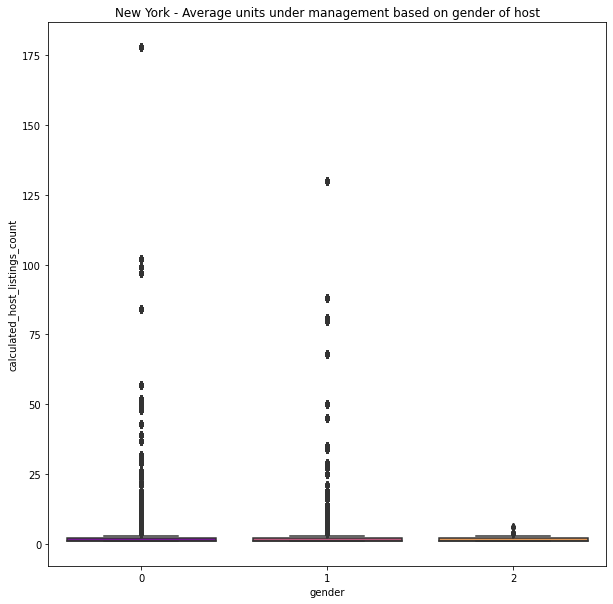

In [83]:
print(f'Average units under management for properties with female host in New York {ny_female_df["calculated_host_listings_count"].mean()}')
print(f'Average units under management for properties with male host in New York {ny_male_df["calculated_host_listings_count"].mean()}')


sns.boxplot(y='calculated_host_listings_count', x='gender', data=ny_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('New York - Average units under management based on gender of host')

Nights available to rent

Average Nights available to rent for properties with female host in New York 124.96279975880142
Average Nights available to rent for properties with male host in New York 124.87763376767397


Text(0.5, 1.0, 'New York - Nights available to rent based on gender of host')

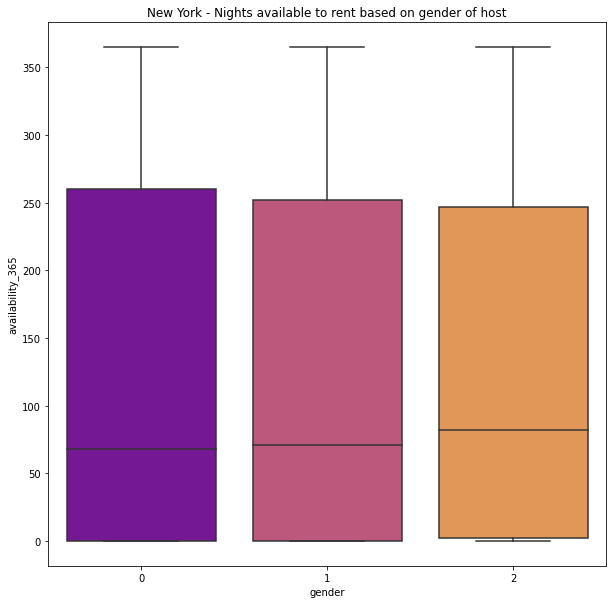

In [84]:
print(f'Average Nights available to rent for properties with female host in New York {ny_female_df["availability_365"].mean()}')
print(f'Average Nights available to rent for properties with male host in New York {ny_male_df["availability_365"].mean()}')

sns.boxplot(y='availability_365', x='gender', data=ny_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('New York - Nights available to rent based on gender of host')

Average per night charge?

Average per night charge for properties with female host in New York 146.97991558050003
Average per night charge for properties with emale host in New York 153.17386332131966


Text(0.5, 1.0, 'New York - Average per night charge based on gender of host')

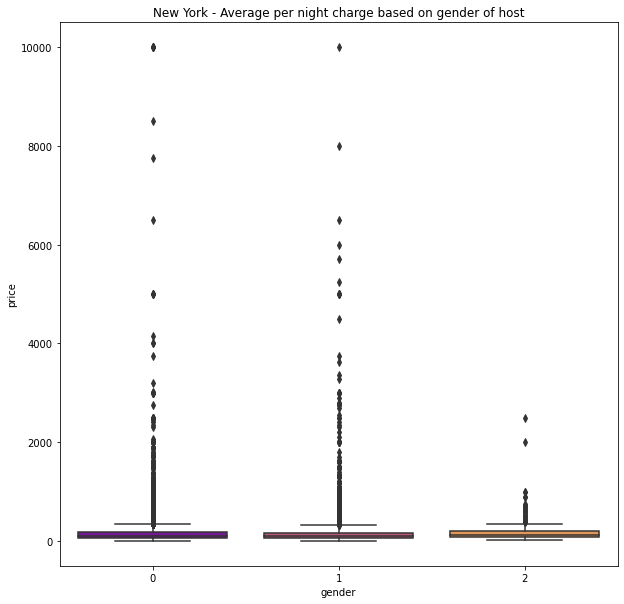

In [85]:
print(f'Average per night charge for properties with female host in New York {ny_female_df["price"].mean()}')
print(f'Average per night charge for properties with emale host in New York {ny_male_df["price"].mean()}')


sns.boxplot(y='price', x='gender', data=ny_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('New York - Average per night charge based on gender of host')

Are these patterns generalizable to the geographies outlined above?


Average units under management for properties with female host in Hong Kong 10.084861183865899
Average units under management for properties with male host in Hong Kong 13.096809338521402


Text(0.5, 1.0, 'Hong Kong - Average units under management based on gender of host')

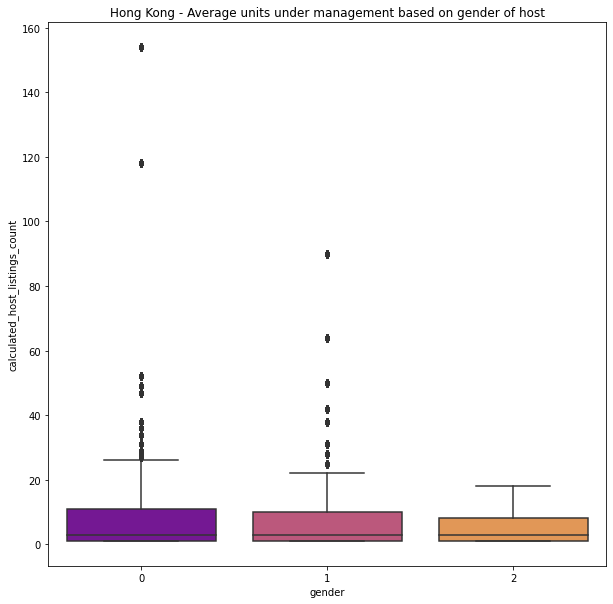

In [87]:
print(f'Average units under management for properties with female host in Hong Kong {hk_female_df["calculated_host_listings_count"].mean()}')
print(f'Average units under management for properties with male host in Hong Kong {hk_male_df["calculated_host_listings_count"].mean()}')

sns.boxplot(y='calculated_host_listings_count', x='gender', data=hk_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Hong Kong - Average units under management based on gender of host')

Average Nights available to rent for properties with female host in Hong Kong 137.66474594028287
Average Nights available to rent for properties with male host in Hong Kong 151.9385214007782


Text(0.5, 1.0, 'Hong Kong - Nights available to rent based on gender of host')

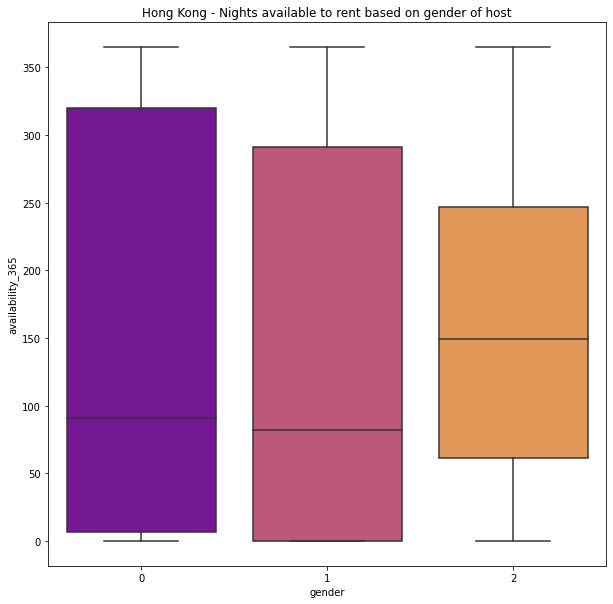

In [88]:
print(f'Average Nights available to rent for properties with female host in Hong Kong {hk_female_df["availability_365"].mean()}')
print(f'Average Nights available to rent for properties with male host in Hong Kong {hk_male_df["availability_365"].mean()}')

sns.boxplot(y='availability_365', x='gender', data=hk_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Hong Kong - Nights available to rent based on gender of host')

Average per night charge for properties with female host in Hong Kong 908.9869041382923
Average per night charge for properties with emale host in Hong Kong 911.7326070038911


Text(0.5, 1.0, 'Hong Kong - Average per night charge based on gender of host')

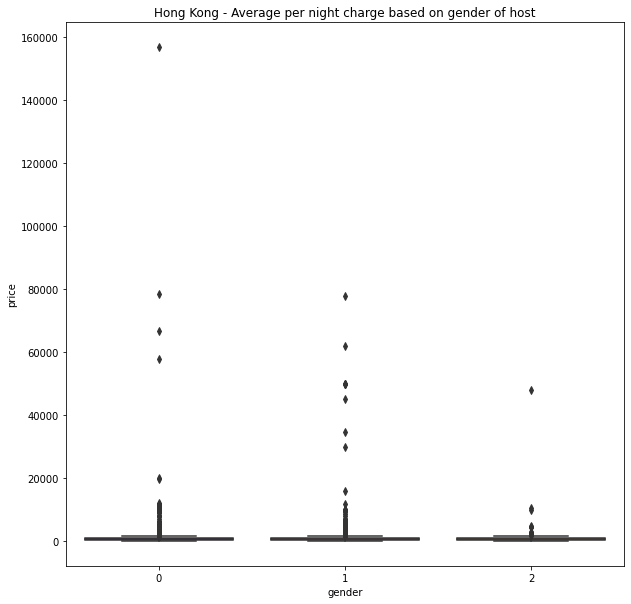

In [89]:
print(f'Average per night charge for properties with female host in Hong Kong {hk_female_df["price"].mean()}')
print(f'Average per night charge for properties with emale host in Hong Kong {hk_male_df["price"].mean()}')

sns.boxplot(y='price', x='gender', data=hk_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Hong Kong - Average per night charge based on gender of host')

Average units under management for properties with female host in Cape Town 6.704685942173479
Average units under management for properties with male host in Cape Town 9.259895570153276


Text(0.5, 1.0, 'Cape Town - Average units under management based on gender of host')

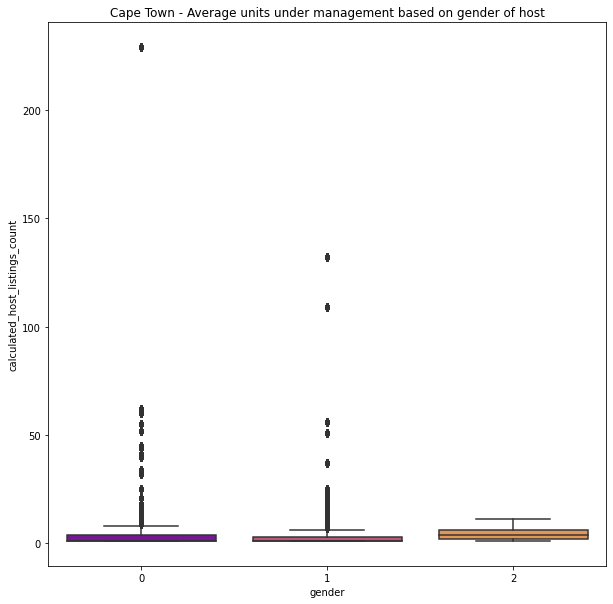

In [90]:
print(f'Average units under management for properties with female host in Cape Town {ct_female_df["calculated_host_listings_count"].mean()}')
print(f'Average units under management for properties with male host in Cape Town {ct_male_df["calculated_host_listings_count"].mean()}')


sns.boxplot(y='calculated_host_listings_count', x='gender', data=ct_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Cape Town - Average units under management based on gender of host')

Average Nights available to rent for properties with female host in Cape Town 199.7639082751745
Average Nights available to rent for properties with male host in Cape Town 195.62540003368704


Text(0.5, 1.0, 'Cape Town - Nights available to rent based on gender of host')

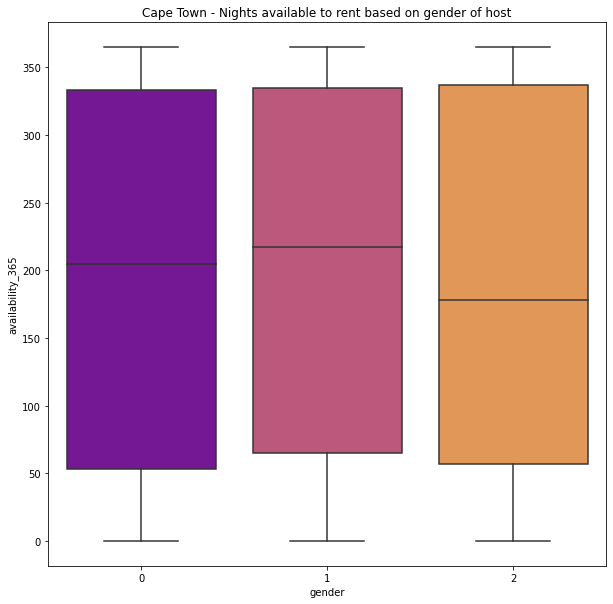

In [91]:
print(f'Average Nights available to rent for properties with female host in Cape Town {ct_female_df["availability_365"].mean()}')
print(f'Average Nights available to rent for properties with male host in Cape Town {ct_male_df["availability_365"].mean()}')

sns.boxplot(y='availability_365', x='gender', data=ct_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Cape Town - Nights available to rent based on gender of host')

Average per night charge for properties with female host in Cape Town 2152.200598205384
Average per night charge for properties with emale host in Cape Town 2294.2633484925045


Text(0.5, 1.0, 'Cape Town - Average per night charge based on gender of host')

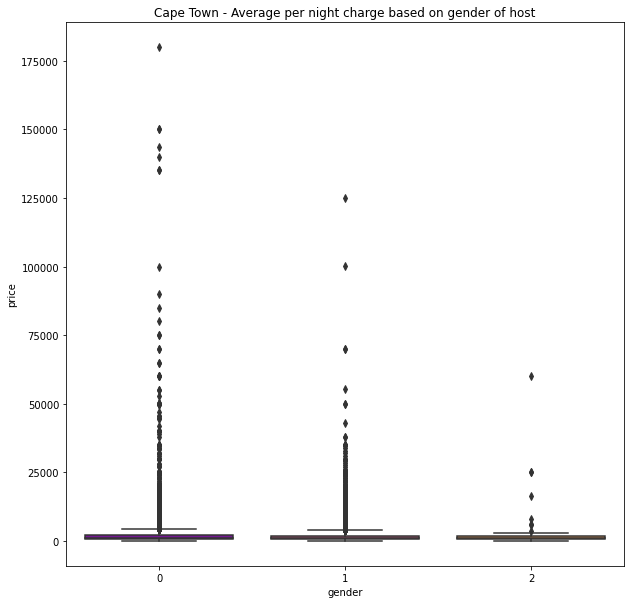

In [92]:
print(f'Average per night charge for properties with female host in Cape Town {ct_female_df["price"].mean()}')
print(f'Average per night charge for properties with emale host in Cape Town {ct_male_df["price"].mean()}')

sns.boxplot(y='price', x='gender', data=ct_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('Cape Town - Average per night charge based on gender of host')

Average units under management for properties with female host in London 42.61176637771778
Average units under management for properties with male host in London 7.203601108033241


Text(0.5, 1.0, 'London - Average units under management based on gender of host')

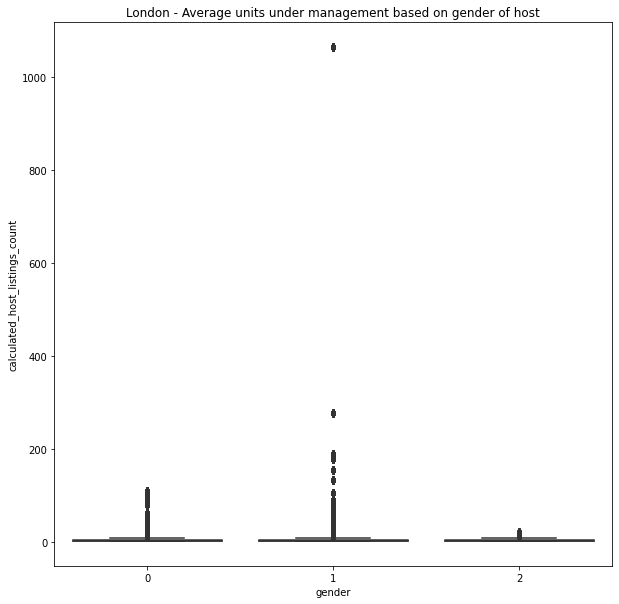

In [93]:
print(f'Average units under management for properties with female host in London {l_female_df["calculated_host_listings_count"].mean()}')
print(f'Average units under management for properties with male host in London {l_male_df["calculated_host_listings_count"].mean()}')

sns.boxplot(y='calculated_host_listings_count', x='gender', data=l_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('London - Average units under management based on gender of host')

Average Nights available to rent for properties with female host in London 114.76580929373313
Average Nights available to rent for properties with male host in London 126.43774477027414


Text(0.5, 1.0, 'London - Nights available to rent based on gender of host')

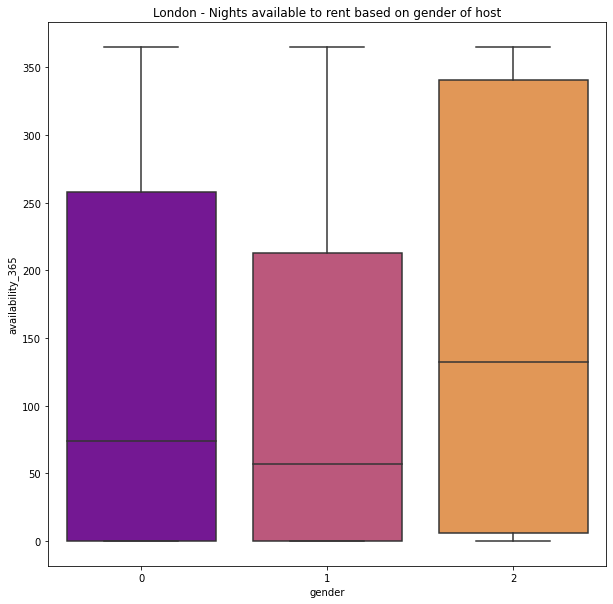

In [94]:
print(f'Average Nights available to rent for properties with female host in London {l_female_df["availability_365"].mean()}')
print(f'Average Nights available to rent for properties with male host in London {l_male_df["availability_365"].mean()}')

sns.boxplot(y='availability_365', x='gender', data=l_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('London - Nights available to rent based on gender of host')

Average per night charge for properties with female host in London 115.62481170953531
Average per night charge for properties with male host in London 110.13026554589742


Text(0.5, 1.0, 'London - Average per night charge based on gender of host')

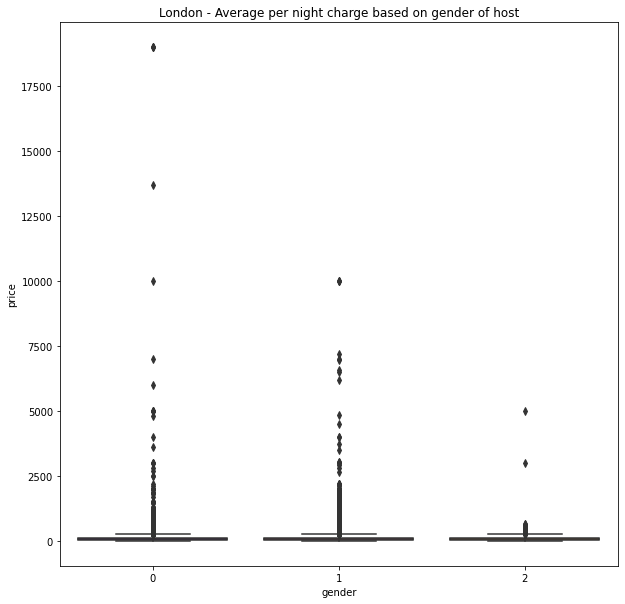

In [95]:
print(f'Average per night charge for properties with female host in London {l_female_df["price"].mean()}')
print(f'Average per night charge for properties with male host in London {l_male_df["price"].mean()}')

sns.boxplot(y='price', x='gender', data=l_df, palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,10)
plt.title('London - Average per night charge based on gender of host')

In [ ]:
'''
Sentiments ?

'''